# Merfish data playground

In [1]:
import os
import numpy as np
import scipy.interpolate
import seaborn
import matplotlib.pyplot as plt
import pandas as pd

from segmentation import SpotTable, run_baysor

In [2]:
os.getcwd()

'C:\\Users\\stephanies\\spatial-analysis-wg\\code\\segmentation'

In [2]:
def load_and_cache(csv_file):
    """Load data from merfish detected transcripts csv file.
    
    Since this is a slow process, also save out a cache .npz file to speed up subsequent accesses.
    """
    np_file = os.path.splitext(csv_file)[0] + '.npz'
    if not os.path.exists(np_file):
        print("Loading csv..")
        dtype = [('x', 'float32'), ('y', 'float32'), ('z', 'float32'), ('gene', 'S20')]
        raw_data = np.loadtxt(csv_file, skiprows=1, usecols=[2,3,4,9], delimiter=',', dtype=dtype)
        
        # convert genes to int ID
        genes = np.unique(raw_data['gene'])
        gene_map = {gene:i for i, gene in enumerate(genes)}
        data = np.empty(len(raw_data), dtype=[('x', 'float32'), ('y', 'float32'), ('z', 'float32'), ('gene', 'int')])
        data['x'] = raw_data['x']
        data['y'] = raw_data['y']
        data['z'] = raw_data['z']
        data['gene'] = [gene_map[g] for g in raw_data['gene']]    
        
        print("Recompressing to npz..")
        np.savez_compressed(np_file, data)
    else:
        print("Loading from npz..")
        data = np.load(np_file)['arr_0']
    return data

## Load merfish data, plot a subset of detected transcripts

In [3]:
data_path = '../../../data/merscope_pilot/merfish_output/mfishMERSCOPEmacaqueAtlas/1191380492/region_0/'

In [4]:
data_file = data_path + 'detected_transcripts.csv'
data = load_and_cache(data_file)

Loading from npz..


In [5]:
table = SpotTable(data)

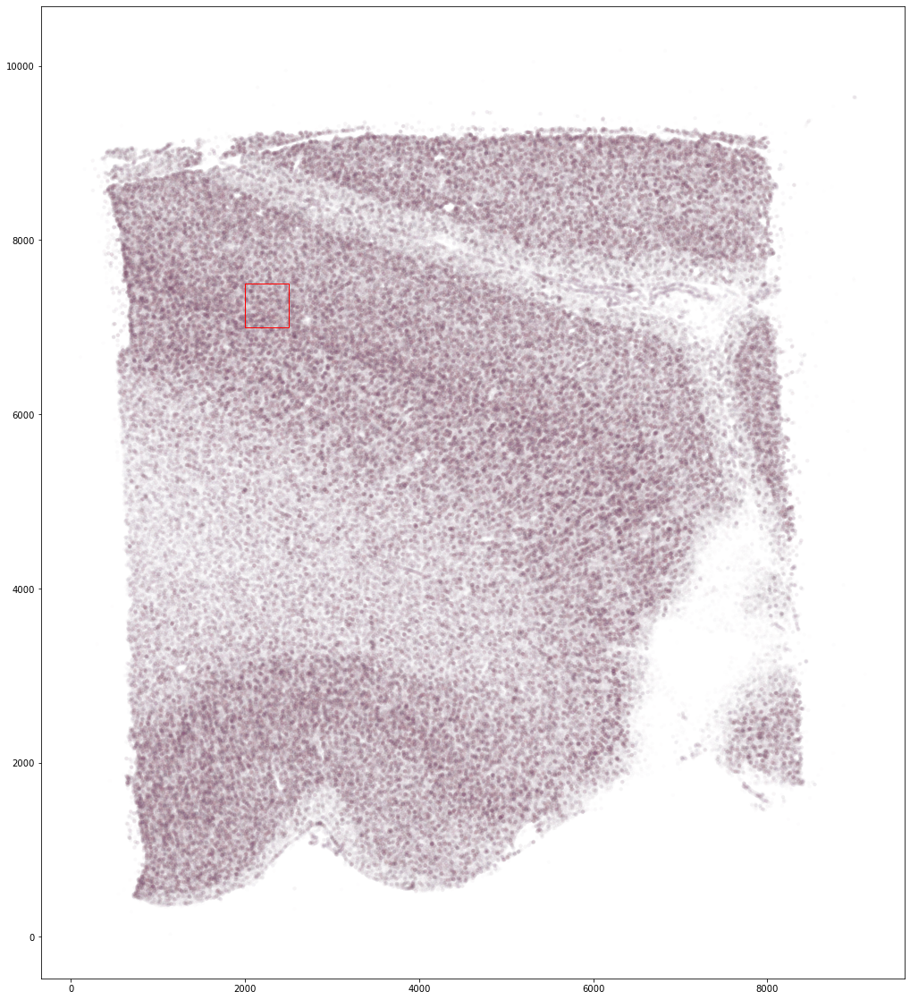

In [25]:
sub = table.get_subregion(xlim=(2000, 2500), ylim=(7000, 7500))

fig, ax = plt.subplots(figsize=(20, 20))
table[::100].scatter_plot(ax=ax, alpha=0.01)
sub.plot_rect(ax, 'r')

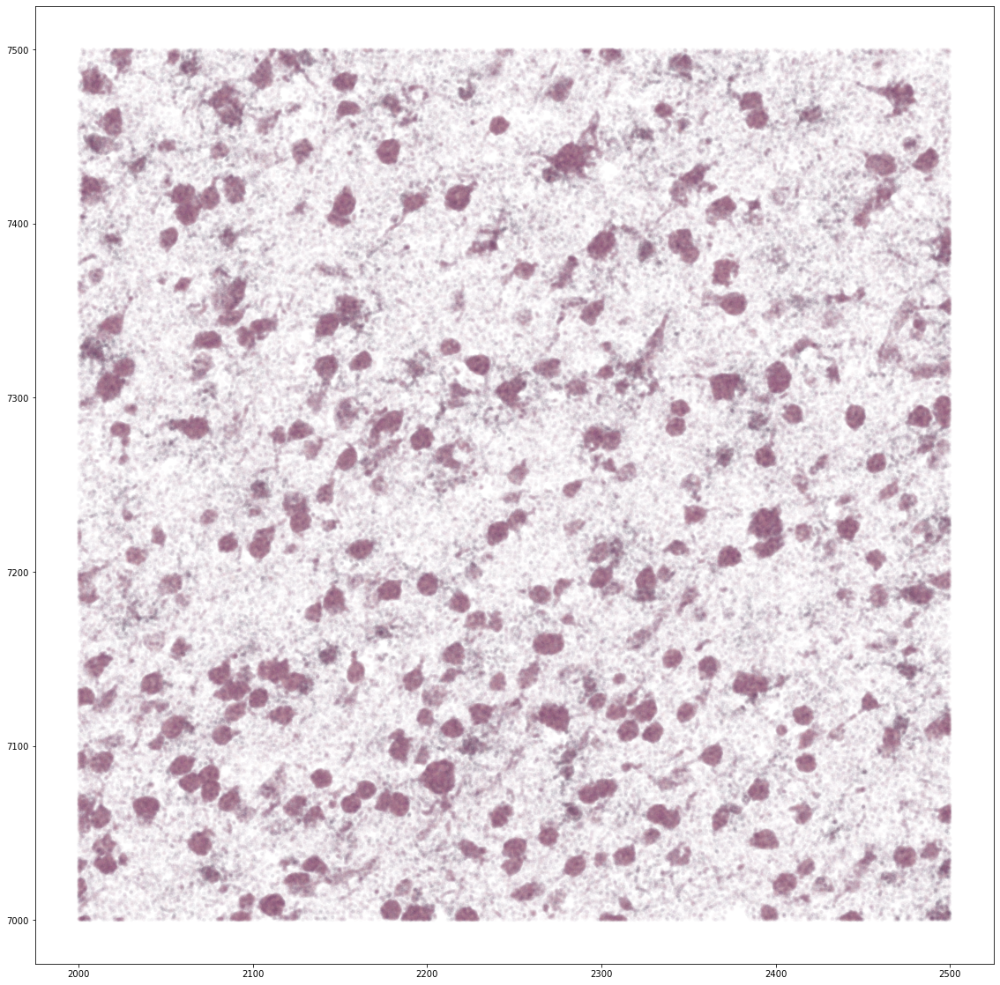

In [22]:
fig, ax = plt.subplots(figsize=(20, 20))
sub.scatter_plot(ax=ax, alpha=0.03)

## Select a subregion to plot

In [23]:
xlim = (2000, 2500)
ylim = (7000, 7500)

#xlim = (5650, 5700)
#ylim = (6100, 6150)

mask = (data['x'] > xlim[0]) & (data['x'] < xlim[1]) & (data['y'] > ylim[0]) & (data['y'] < ylim[1])
data2 = data[mask]
#data2 = data2[data2[:,2] == data2[:,2].min()]
data2.shape

(831233,)

<AxesSubplot:>

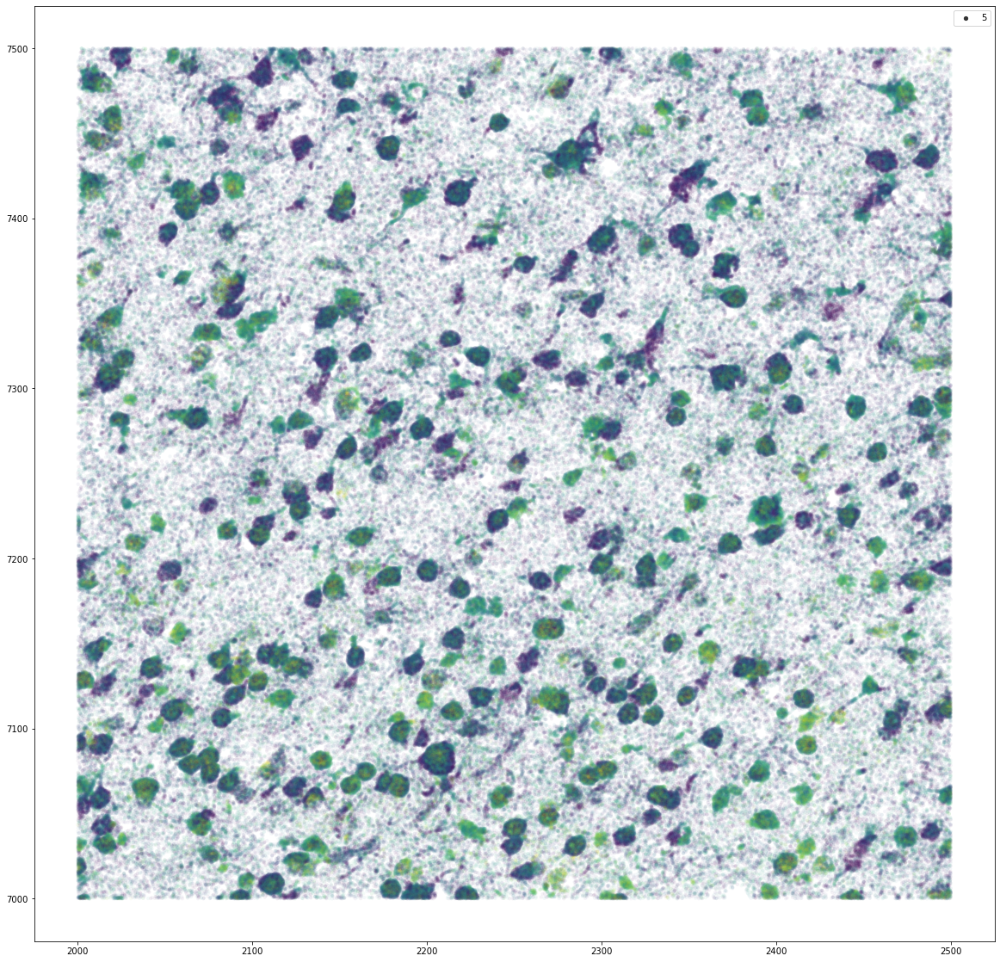

In [24]:
fig,ax = plt.subplots(figsize=(20, 20))
seaborn.scatterplot(x=data2['x'], y=data2['y'], c=data2['z'], alpha=0.05, linewidth=0, ax=ax, size=5)

## Generate maps colored by transcript expression levels

Approach:
- bin data into pixels
- sum up expression counts in each bin
- use umap to identify different types of expression patterns
- color each pixel based on position within umap

In [26]:
from tqdm.notebook import tqdm_notebook as tqdm

def binned_expression_counts(x, y, gene, binsize, spacing=None):
    spacing = spacing or binsize
    padding = (binsize - spacing) / 2
    
    xrange = x.min(), x.max()
    yrange = y.min(), y.max()
    gene_set = np.unique(gene)
    gene_inds = {gene_set[i]:i for i in range(len(gene_set))} 
    
    x_bins = int(np.ceil((xrange[1] - xrange[0]) / spacing))
    y_bins = int(np.ceil((yrange[1] - yrange[0]) / spacing))
    shape = (x_bins, y_bins, len(gene_set))
    
    counts = np.zeros(shape, dtype='uint32')
    for i in tqdm(range(x_bins)):
        xbin = (xrange[0] + i * spacing - padding), (xrange[0] + (i+1) * spacing + padding)
        xmask = (x > xbin[0]) & (x < xbin[1])
        y2 = y[xmask]
        g2 = gene[xmask]
        for j in range(y_bins):
            ybin = (yrange[0] + j * spacing - padding), (yrange[0] + (j+1) * spacing + padding)
            ymask = (y2 > ybin[0]) & (y2 < ybin[1])
            g3 = g2[ymask]
            for g, c in zip(*np.unique(g3, return_counts=True)):
                counts[i, j, gene_inds[g]] = c
                
    return counts, gene_set, gene_inds, (xrange[0], xrange[0] + binsize * x_bins), (yrange[0], yrange[0] + binsize * y_bins)
    

In [27]:
import umap
from sklearn.preprocessing import StandardScaler

def reduce_expression(data, umap_args):
    default_umap_args = {'n_neighbors': 3, 'min_dist': 0.4, 'n_components': 3}
    default_umap_args.update(umap_args)

    flat_data = data.reshape(data.shape[0] * data.shape[1], data.shape[2])
    
    # remove rows with no transcripts
    mask = flat_data.sum(axis=1) > 0
    masked_data = flat_data[mask]
    
    # scale in prep for umap
    scaler = StandardScaler()
    scaled = scaler.fit_transform(masked_data)
    
    # reduce down to 3D
    reducer = umap.UMAP(**default_umap_args)    
    reduced = reducer.fit_transform(scaled)
    
    # re-insert rows with no transcripts (all 0)
    final = np.zeros((len(flat_data), reduced.shape[1]), dtype=reduced.dtype)
    final[mask] = reduced
    
    # return reshaped to original image
    return final.reshape(data.shape[0], data.shape[1], final.shape[-1])
    


In [28]:
def map_to_ubyte(data):
    mn, mx = data.min(), data.max()
    return np.clip((data - mn) * 255 / (mx - mn), 0, 255).astype('ubyte')

def rainbow_wheel(points, center=None, radius=None, center_color=None):
    """Given an Nx2 array of point locations, return an Nx3 array of RGB
    colors derived from a rainbow color wheel centered over the mean point location.
    """
    flat = points.reshape(np.product(points.shape[:-1]), points.shape[-1])
    if center is None:
        center = flat.mean(axis=0)
    if radius is None:
        radius = 4 * flat.std(axis=0)
    f = np.linspace(0, 1, 10)[:-1]
    theta = f * 2 * np.pi
    x = np.vstack([radius[0] * np.cos(theta) + center[0], radius[1] * np.sin(theta) + center[1]]).T
    c = plt.cm.gist_rainbow(f)[:, :3]
    
    if center_color is not None:
        x = np.concatenate([x, center[None, :]], axis=0)
        c = np.concatenate([c, np.array(center_color)[None, :]], axis=0)
    
    color = scipy.interpolate.griddata(x, c, flat[:, :2], fill_value=0)
    return color.reshape(points.shape[:-1] + (3,))
    
def show_float_rgb(data, extent, ax):
    """Show a color image given a WxHx3 array of floats. 
    Each channel is normalized independently. 
    """
    rgb = np.empty(data.shape[:2] + (3,), dtype='ubyte')
    for i in (0, 1, 2):
        rgb[..., i] = map_to_ubyte(data[..., i])

    return ax.imshow(np.rot90(rgb), extent=extent, aspect='equal')

### 1. bin data into pixels, sum expression counts within each bin

In [29]:
print("Binning expression counts..")
bec, genes, gene_index, xrange, yrange = binned_expression_counts(data['x'], data['y'], data['gene'], binsize=100)
bec.shape

Binning expression counts..


  0%|          | 0/92 [00:00<?, ?it/s]

(92, 104, 495)

### 2. reduce dimensionality of expression counts

In [30]:
print("Reducing binned expression counts..")
reduced = reduce_expression(bec, umap_args=dict(
    min_dist=0.4,
    n_neighbors=5,
    random_state=0,
))
reduced.shape

Reducing binned expression counts..


(92, 104, 3)

### 3. color pixels based on umap position

Generate rainbow colors around a pinwheel and paint this into umap space

<AxesSubplot:>

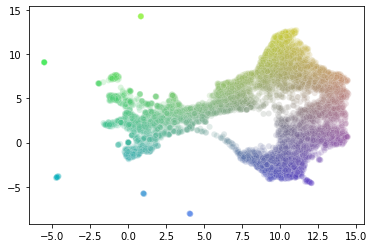

In [31]:
flat = reduced.reshape(reduced.shape[0] * reduced.shape[1], reduced.shape[2])
color = rainbow_wheel(flat)
seaborn.scatterplot(x=flat[:,0], y=flat[:,1], c=color, alpha=0.2)

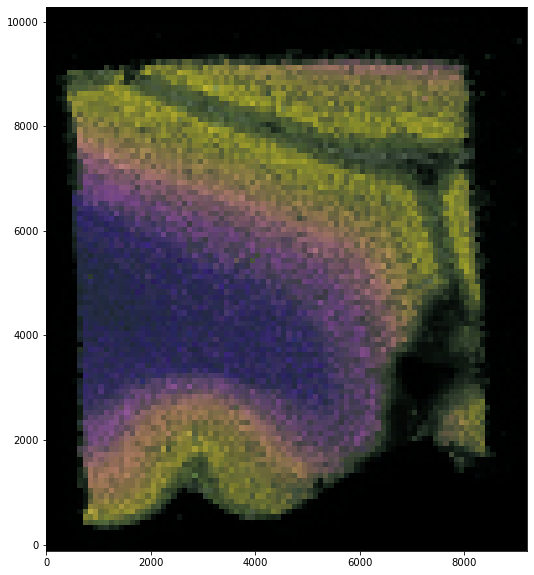

In [32]:
fig, ax = plt.subplots(figsize=(10, 10))

reduce_norm = (reduced - reduced.min()) / (reduced.max() - reduced.min())

rgb = rainbow_wheel(reduced)
norm = bec.sum(axis=2)
norm = norm / norm.max()
rgb *= np.sqrt(norm[:, :, None])

extent = xrange + yrange
ax.imshow(np.rot90(rgb), extent=extent, aspect='equal')

### define a function to put this all together

In [33]:
def reduced_expression_map(data, binsize, umap_args, spacing=None, xlim=None, ylim=None, figsize=(10, 10)):    
    if xlim is not None:
        data = data[(data['x'] >= xlim[0]) & (data['x'] < xlim[1])]
    if ylim is not None:
        data = data[(data['y'] >= ylim[0]) & (data['y'] < ylim[1])]
        
    print("Binning expression counts..")
    bec, genes, gene_index, xrange, yrange = binned_expression_counts(data['x'], data['y'], data['gene'], binsize=binsize, spacing=spacing)

    print("Reducing binned expression counts..")
    umap_args['n_components'] = 2
    reduced = reduce_expression(bec, umap_args=umap_args)
    
    norm = bec.sum(axis=2)
    norm = norm / norm.max()
    color = rainbow_wheel(reduced) * np.sqrt(norm[:, :, None])
    
    fig, ax = plt.subplots(figsize=figsize)
    show_float_rgb(color, extent=xrange + yrange, ax=ax)

    return (bec, genes, xrange, yrange), (reduced,), (fig, ax)

In [34]:
# now plot transcripts in a subregion, using the assigned gene colors
xlim = (2000, 2500)
ylim = (7000, 7500)

mask = (data['x'] > xlim[0]) & (data['x'] < xlim[1]) & (data['y'] > ylim[0]) & (data['y'] < ylim[1])
data2 = data[mask]
data2.shape

(831233,)

Binning expression counts..


  0%|          | 0/100 [00:00<?, ?it/s]

Reducing binned expression counts..


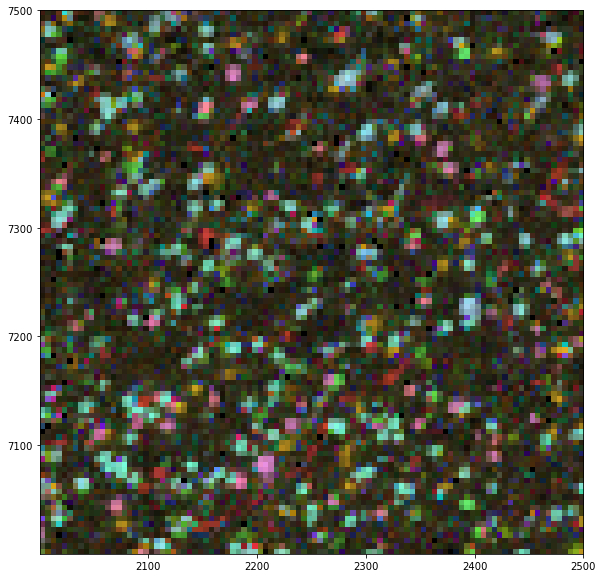

In [35]:
results1 = reduced_expression_map(
    data2, 
    binsize=5, 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=10,
        random_state=0,
    )
)

**That works pretty well, but can we use this to color transcripts in a scatter plot instead of coloring pixels?**

In [36]:
def gene_center_of_mass(bec, reduced):
    """Given binned expression counts and a umap reduction, 
    find the center of mass position for each gene in umap space.
    """
    expression_sum = bec.sum(axis=0)
    expression_sum[expression_sum==0] = 1  # silence div-by-zero warnings
    expression_norm = bec / expression_sum

    x = (reduced[:, :, 0, None] * expression_norm).sum(axis=0).sum(axis=0)
    y = (reduced[:, :, 1, None] * expression_norm).sum(axis=0).sum(axis=0)
    gene_pts = np.vstack([x, y]).T
    return gene_pts

In [37]:
gene_pts = gene_center_of_mass(bec, reduced)
gene_pts.shape

(495, 2)

In [38]:
# select gene colors from rainbow, but using the original reduced umap space to set the center/range of the pinwheel
gene_colors = rainbow_wheel(gene_pts, center_color=(0.8, 0.8, 0.8))
gene_colors.shape

(495, 3)

<AxesSubplot:>

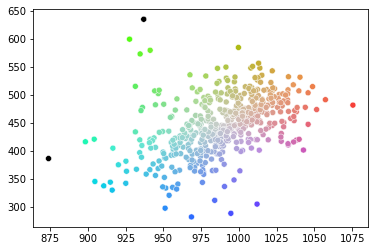

In [39]:
seaborn.scatterplot(x=gene_pts[:,0], y=gene_pts[:,1], c=gene_colors)

<AxesSubplot:>

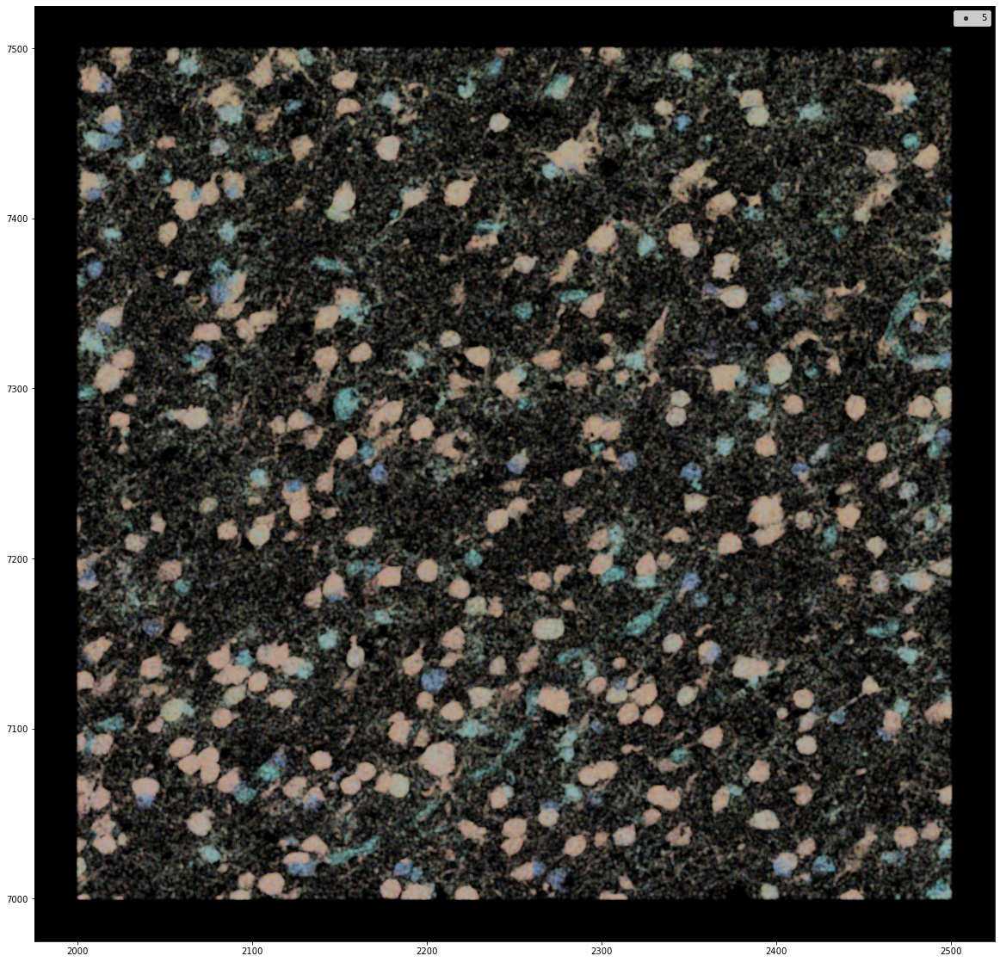

In [40]:
fig,ax = plt.subplots(figsize=(20, 20))
ax.set_facecolor('black')
color = [gene_colors[gene_index[g]] for g in data2['gene']]
seaborn.scatterplot(x=data2['x'], y=data2['y'], c=color, alpha=0.05, linewidth=0, ax=ax, size=5)

In [41]:
def reduced_gene_colors(data, binsize, umap_args, spacing=None):
    print("Binning expression counts..")
    bec, genes, gene_index, xrange, yrange = binned_expression_counts(data['x'], data['y'], data['gene'], binsize=binsize, spacing=spacing)

    print("Reducing binned expression counts..")
    umap_args['n_components'] = 2
    reduced = reduce_expression(bec, umap_args=umap_args)
    
    gene_pts = gene_center_of_mass(bec, reduced)
    gene_colors = rainbow_wheel(gene_pts, center_color=(0.8, 0.8, 0.8))
    color = [gene_colors[gene_index[g]] for g in data['gene']]
    return np.array(color)


def reduced_color_scatterplot(data, binsize, umap_args, spacing=None, xlim=None, ylim=None, figsize=(10, 10), size=2):
    if xlim is not None:
        data = data[(data['x'] >= xlim[0]) & (data['x'] < xlim[1])]
    if ylim is not None:
        data = data[(data['y'] >= ylim[0]) & (data['y'] < ylim[1])]

    color = reduced_gene_colors(data, binsize=binsize, umap_args=umap_args, spacing=spacing)

    fig_area = figsize[0] * figsize[1]
    n_pts = len(data)
    pts_per_pixel = n_pts / (fig_area * 2500)
    if pts_per_pixel >= 2:
        subsample = int(pts_per_pixel)
        print("subsample:", len(data), subsample, pts_per_pixel)
        data = data[::subsample]
        color = color[::subsample]
        n_pts = len(data)
        pts_per_pixel = n_pts / (fig_area * 2500)
    alpha = np.clip(0.03 / pts_per_pixel, 2/254, 1)
    
    fig,ax = plt.subplots(figsize=figsize)
    ax.set_facecolor('black')
    seaborn.scatterplot(x=data['x'], y=data['y'], c=color, alpha=alpha, linewidth=0, ax=ax, size=size, legend=False)    

Binning expression counts..


  0%|          | 0/184 [00:00<?, ?it/s]

Reducing binned expression counts..


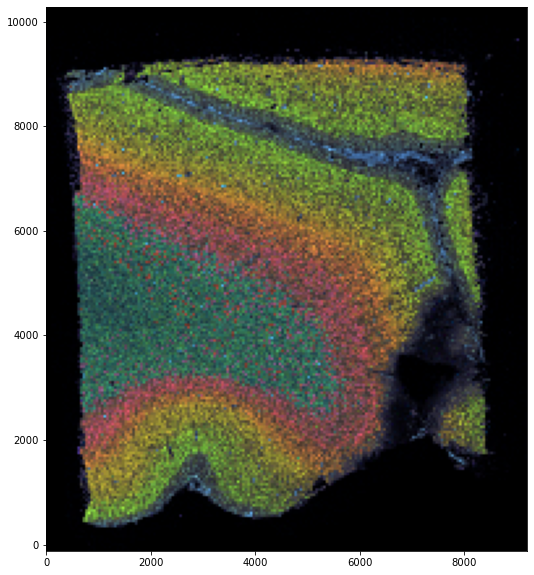

In [42]:
results1 = reduced_expression_map(
    data, 
    binsize=50, 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=10,
        random_state=0,
    )
)

Binning expression counts..


  0%|          | 0/80 [00:00<?, ?it/s]

Reducing binned expression counts..


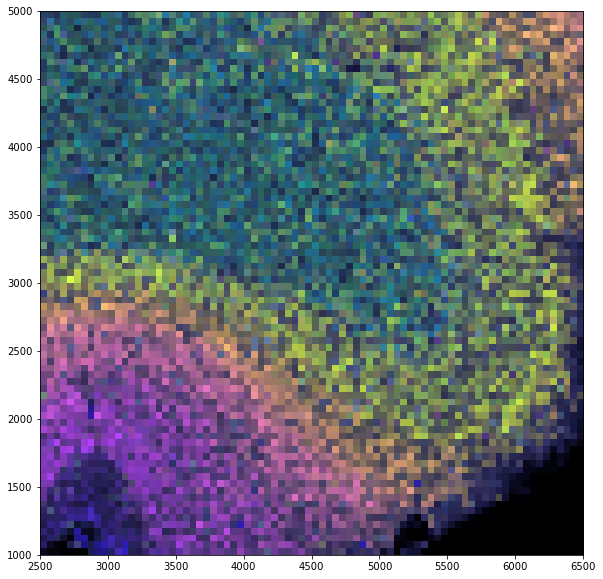

In [44]:
results2 = reduced_expression_map(
    data, 
    binsize=50, 
    xlim=(2500, 6500), 
    ylim=(1000, 5000), 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=10,
        random_state=0,
    )
)

Binning expression counts..


  0%|          | 0/300 [00:00<?, ?it/s]

Reducing binned expression counts..


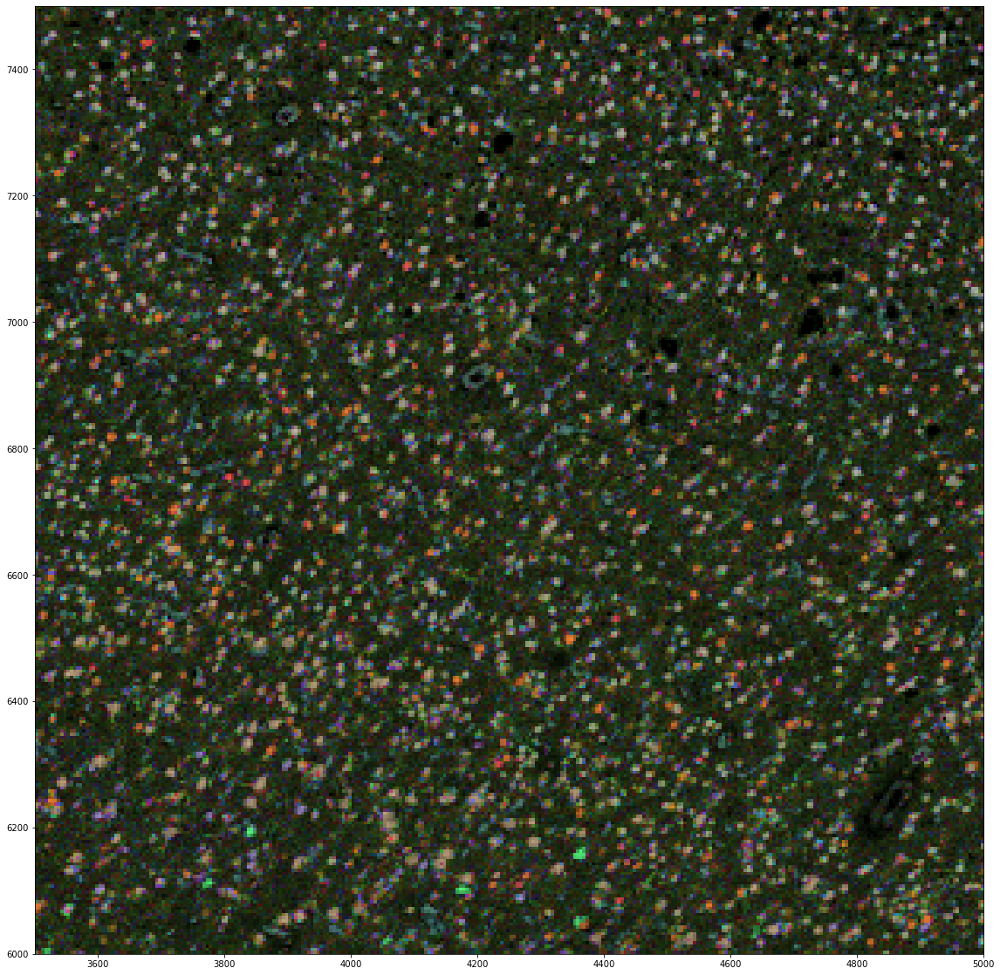

In [47]:
results4 = reduced_expression_map(
    data, 
    binsize=5, 
    xlim=(3500, 5000), 
    ylim=(6000, 7500), 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=5,
        random_state=0,
    ),
    figsize=(20, 20)
)

Some general expression stats

In [8]:
data_df = pd.read_csv(data_path + 'detected_transcripts.csv')
data_df.head()

,Unnamed: 0,barcode_id,global_x,global_y,global_z,x,y,fov,gene,transcript_id
0,88013,27,299.70926,3361.1228,2.0,1893.93550,745.43884,0,PI4KA,ENSMMUT00000031179
1,116100,37,164.03716,3391.2712,1.0,637.71250,1024.58970,0,FNBP1L,ENSMMUT00000107881
2,116107,37,112.18667,3401.0479,1.0,157.61546,1115.11390,0,FNBP1L,ENSMMUT00000107881
3,116188,37,238.49830,3297.5066,2.0,1327.16760,156.39842,0,FNBP1L,ENSMMUT00000107881
4,116472,37,240.06131,3445.1814,3.0,1341.63990,1523.75790,0,FNBP1L,ENSMMUT00000107881


In [35]:
sn_sums = pd.read_csv('../../../data/merscope_pilot/single_nucleus_gene_sums.csv')
sn_sums.rename(columns={'Unnamed: 0': 'gene', 'rowSums(sn_data)': 'total counts'}, inplace=True)
sn_sums.set_index('gene', inplace=True)
sn_sums.head()

,total counts
gene,
PGBD2,9048
LOC114674980,4
TRNAE-CUC,0
ZNF692,71496
TRNAL-CAA,1


In [57]:
merfish_sums = data_df.groupby('gene').count()
merfish_sums.head()

,Unnamed: 0,barcode_id,global_x,global_y,global_z,x,y,fov,transcript_id
gene,,,,,,,,,
ABCC5,317099,317099,317099,317099,317099,317099,317099,317099,317099
ABLIM2,624385,624385,624385,624385,624385,624385,624385,624385,624385
ABR,1875398,1875398,1875398,1875398,1875398,1875398,1875398,1875398,1875398
ADAMTS3,61223,61223,61223,61223,61223,61223,61223,61223,61223
ADAMTSL3,85371,85371,85371,85371,85371,85371,85371,85371,85371


In [58]:
merfish_sums2 = merfish_sums['Unnamed: 0']
merfish_sums2 = pd.DataFrame(merfish_sums2).rename(columns={'Unnamed: 0': 'total counts'})
merfish_sums2.head()

,total counts
gene,
ABCC5,317099
ABLIM2,624385
ABR,1875398
ADAMTS3,61223
ADAMTSL3,85371


In [59]:
merge_counts = merfish_sums2.merge(sn_sums, left_index=True, right_index=True, suffixes=['_merfish', '_rnaseq'])
merge_counts.head()

,total counts_merfish,total counts_rnaseq
gene,,
ABCC5,317099,228992
ABLIM2,624385,396877
ABR,1875398,389663
ADAMTS3,61223,78188
ADAMTSL3,85371,185490


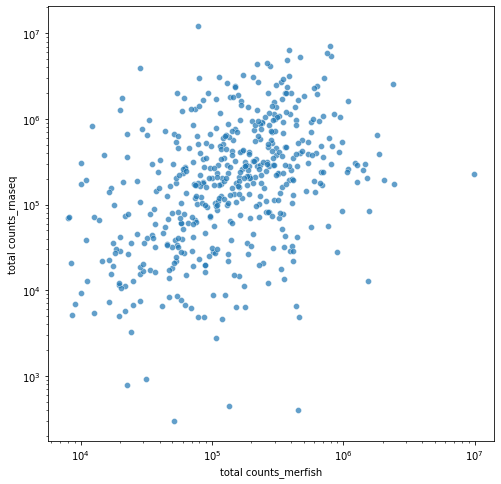

In [137]:
import seaborn as sns

fig, ax = plt.subplots(figsize=(8,8))

sns.scatterplot(data=merge_counts, x='total counts_merfish', y='total counts_rnaseq', ax=ax, alpha=0.7)
ax.set_xscale('log')
ax.set_yscale('log')

In [79]:
from scipy import stats

scorr = stats.spearmanr(merge_counts['total counts_merfish'].to_numpy(), merge_counts['total counts_rnaseq'].to_numpy(), nan_policy='omit')
scorr

SpearmanrResult(correlation=0.41926318954941816, pvalue=2.0798765042901912e-22)

In [101]:
mask = merge_counts['total counts_rnaseq'].to_numpy() != 0

log_merfish = np.log(merge_counts['total counts_merfish'].to_numpy()[mask])
log_rnaseq = np.log(merge_counts['total counts_rnaseq'].to_numpy()[mask])

In [102]:
stats.spearmanr(log_merfish, log_rnaseq)

SpearmanrResult(correlation=0.42246543766169525, pvalue=1.2443296095784054e-22)

In [110]:
from sklearn.linear_model import LinearRegression

model = LinearRegression().fit(log_merfish.reshape(-1, 1), log_rnaseq)

model.score(log_merfish.reshape(-1, 1), log_rnaseq)

0.16050907307548967

In [112]:
model.coef_, model.intercept_

(array([0.60044471]), 4.93180667304663)

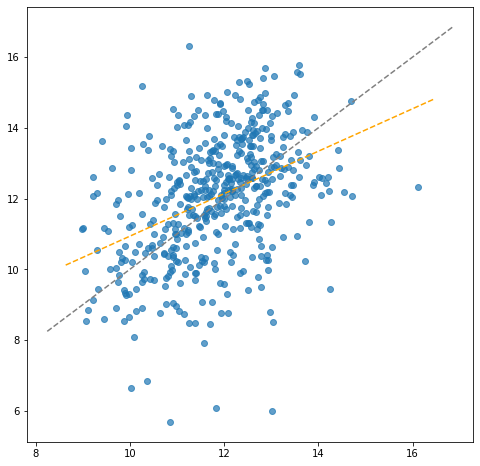

In [118]:
def abline(slope, intercept, ax, color='k'):
    """Plot a line from slope and intercept"""
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    ax.plot(x_vals, y_vals, '--', c=color)
    
fig, ax = plt.subplots(figsize=(8,8))

ax.scatter(log_merfish, log_rnaseq, alpha=0.7)
# ax.set_xscale('log')
# ax.set_yscale('log')

abline(model.coef_, model.intercept_, ax, color='orange')
abline(1, 0, ax, color='grey')

In [121]:
merge_counts[merge_counts['total counts_rnaseq']==0] 

,total counts_merfish,total counts_rnaseq
gene,,
RBFOX1,411104,0
TNRC6A,58967,0
WWOX,70376,0


In [128]:
cbg = pd.read_csv(data_path + 'cell_by_gene.csv')
cbg.rename(columns={'Unnamed: 0': 'cell'}, inplace=True)
cbg.set_index('cell', inplace=True)
cbg.head()

,PCP4,ID2,HOPX,SYNPR,SPP1,MOBP,GAD1,SST,ABR,SLC1A2,...,Blank-46,Blank-47,Blank-48,Blank-49,Blank-50,Blank-51,Blank-52,Blank-53,Blank-54,Blank-55
cell,,,,,,,,,,,,,,,,,,,,,
117253109221519147433111321744978946307,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
126230440039117306828892424659405092347,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
128830593033718710092826390785374416985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
136479604455119038460674554492871550760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
150717841027425015551151207570191880728,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [129]:
cell_blank = cbg[[col for col in cbg.columns if col.startswith('Blank')]]
cell_blank.head()

,Blank-0,Blank-1,Blank-2,Blank-3,Blank-4,Blank-5,Blank-6,Blank-7,Blank-8,Blank-9,...,Blank-46,Blank-47,Blank-48,Blank-49,Blank-50,Blank-51,Blank-52,Blank-53,Blank-54,Blank-55
cell,,,,,,,,,,,,,,,,,,,,,
117253109221519147433111321744978946307,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
126230440039117306828892424659405092347,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
128830593033718710092826390785374416985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
136479604455119038460674554492871550760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
150717841027425015551151207570191880728,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [230]:
blanks_per_cell = cell_blank.sum(axis=1)
blanks_per_cell.describe()

count    117888.000000
mean          3.740160
std           6.018845
min           0.000000
25%           0.000000
50%           1.000000
75%           5.000000
max          91.000000
dtype: float64

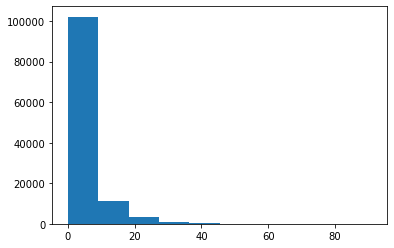

In [231]:
_ = plt.hist(blanks_per_cell)

7873.571428571428


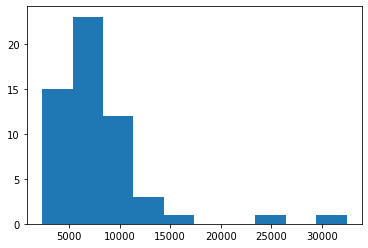

In [141]:
total_blanks = cell_blank.sum().to_numpy()
_ = plt.hist(total_blanks)
avg_blank = np.mean(total_blanks)
print(avg_blank)

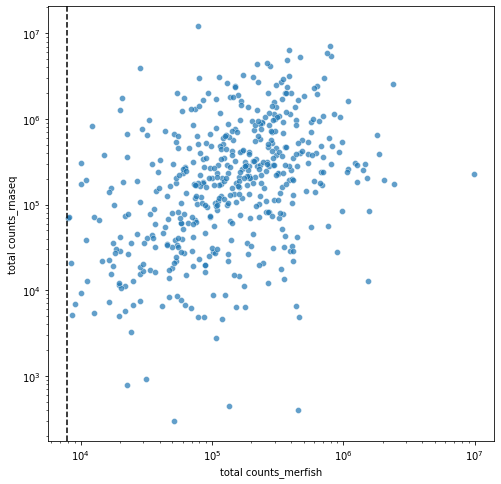

In [142]:
fig, ax = plt.subplots(figsize=(8,8))

sns.scatterplot(data=merge_counts, x='total counts_merfish', y='total counts_rnaseq', ax=ax, alpha=0.7)
ax.set_xscale('log')
ax.set_yscale('log')
ax.axvline(avg_blank, ls='--', color='k')

In [130]:
cell_gene = cbg[[col for col in cbg.columns if col.startswith('Blank')==False]]
cell_gene.head()

,PCP4,ID2,HOPX,SYNPR,SPP1,MOBP,GAD1,SST,ABR,SLC1A2,...,TTN,ARHGEF28,ZBTB20,SGCZ,DOCK2,ARHGAP28,LOC694004,NPSR1,POSTN,MCMDC2
cell,,,,,,,,,,,,,,,,,,,,,
117253109221519147433111321744978946307,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
126230440039117306828892424659405092347,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
128830593033718710092826390785374416985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
136479604455119038460674554492871550760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
150717841027425015551151207570191880728,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [215]:
cell_gene['n_genes'] = cell_gene.apply(lambda x: len(x[x>0]), axis=1)
cell_gene['n_spots'] = cell_gene.apply(lambda x: sum(x[x>0]), axis=1)

C:\Users\stephanies\AppData\Local\Temp\ipykernel_14268\2325433801.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_gene['n_genes'] = cell_gene.apply(lambda x: len(x[x>0]), axis=1)
C:\Users\stephanies\AppData\Local\Temp\ipykernel_14268\2325433801.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_gene['n_spots'] = cell_gene.apply(lambda x: sum(x[x>0]), axis=1)


In [216]:
cell_gene.head()

,PCP4,ID2,HOPX,SYNPR,SPP1,MOBP,GAD1,SST,ABR,SLC1A2,...,ZBTB20,SGCZ,DOCK2,ARHGAP28,LOC694004,NPSR1,POSTN,MCMDC2,n_genes,n_spots
cell,,,,,,,,,,,,,,,,,,,,,
117253109221519147433111321744978946307,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
126230440039117306828892424659405092347,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
128830593033718710092826390785374416985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
136479604455119038460674554492871550760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
150717841027425015551151207570191880728,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0


In [228]:
cell_gene.describe()[['n_genes', 'n_spots']]

,n_genes,n_spots
count,117888.000000,117888.000000
mean,130.660127,677.992043
std,115.374496,810.242048
min,0.000000,0.000000
25%,14.000000,33.000000
50%,116.000000,388.000000
75%,219.000000,1017.000000
max,443.000000,8267.000000


In [233]:
cell_meta = pd.read_csv(data_path + 'cell_metadata.csv')
cell_meta.rename(columns={'Unnamed: 0': 'cell'}, inplace=True)
cell_meta.set_index('cell', inplace=True)
cell_meta.head()

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
cell,,,,,,,,
1849101426878809509770556837196097032,0,1362.597299,113.578200,3295.735479,98.188200,128.968201,3287.311479,3304.159479
201168326311275598684414317623938319497,0,18.655111,141.820201,3283.369479,139.660201,143.980201,3282.127479,3284.611479
229624050559731701691561312373385341414,0,844.120808,124.756201,3430.087482,115.792200,133.720201,3420.907482,3439.267483
270684192156742006402279999613140539716,0,426.119476,261.970204,3286.879479,253.708204,270.232204,3281.479479,3292.279479
2945382571653404687152488603491190845,0,769.644706,208.078203,3305.995479,198.520203,217.636203,3298.111479,3313.879479


<AxesSubplot:xlabel='center_x', ylabel='center_y'>

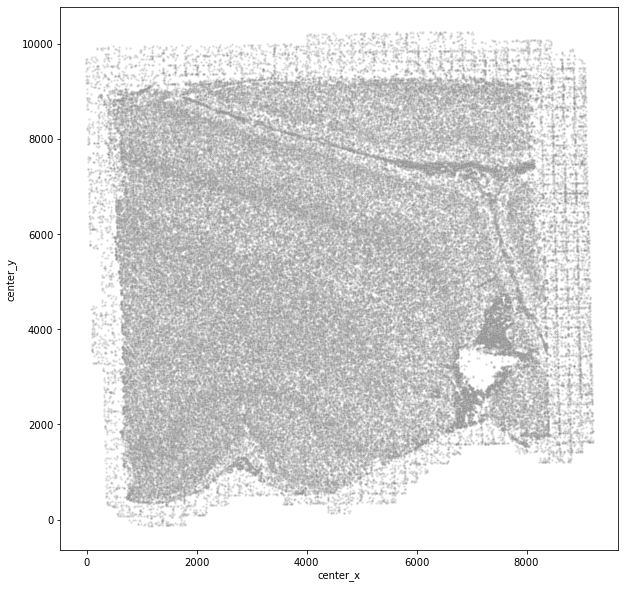

In [158]:
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(data=cell_meta, x='center_x', y='center_y', color='grey', ax=ax, s=5, alpha=0.3)

In [282]:
cell_summary = cell_meta.merge(cell_gene[['n_genes', 'n_spots']], left_index=True, right_index=True)
volume = (cell_summary['volume']>100) & (cell_summary['volume']<3000)
genes = (cell_summary['n_genes']>15)
spots = (cell_summary['n_spots']>100)

filters = volume & genes

cell_filtered = cell_summary[filters]
cell_filtered['filtered'] = 'filtered'
cell_summary = cell_summary.append(cell_filtered)
cell_summary.fillna('all', inplace=True)
cell_summary.head()

C:\Users\stephanies\AppData\Local\Temp\ipykernel_14268\2140781923.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_filtered['filtered'] = 'filtered'
C:\Users\stephanies\AppData\Local\Temp\ipykernel_14268\2140781923.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cell_summary = cell_summary.append(cell_filtered)


,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,n_genes,n_spots,filtered
cell,,,,,,,,,,,
1849101426878809509770556837196097032,0,1362.597299,113.578200,3295.735479,98.188200,128.968201,3287.311479,3304.159479,0,0.0,all
201168326311275598684414317623938319497,0,18.655111,141.820201,3283.369479,139.660201,143.980201,3282.127479,3284.611479,0,0.0,all
229624050559731701691561312373385341414,0,844.120808,124.756201,3430.087482,115.792200,133.720201,3420.907482,3439.267483,0,0.0,all
270684192156742006402279999613140539716,0,426.119476,261.970204,3286.879479,253.708204,270.232204,3281.479479,3292.279479,0,0.0,all
2945382571653404687152488603491190845,0,769.644706,208.078203,3305.995479,198.520203,217.636203,3298.111479,3313.879479,0,0.0,all


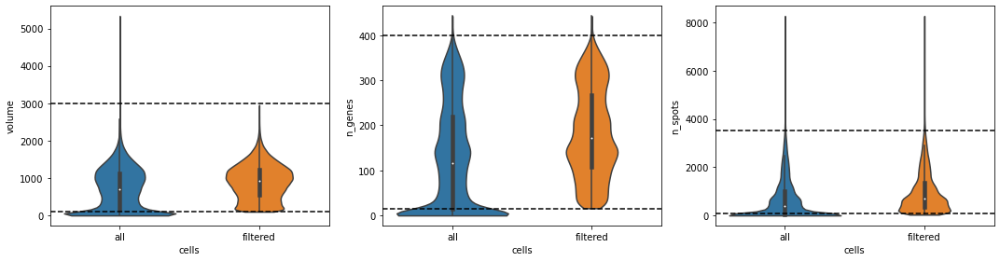

In [283]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4))

sns.violinplot(data=cell_summary, x='filtered', y='volume', cut=0, ax=ax[0])
ax[0].axhline(100, ls='--', c='k')
ax[0].axhline(3000, ls='--', c='k')
sns.violinplot(data=cell_summary, x='filtered', y='n_genes', cut=0, ax=ax[1])
ax[1].axhline(15, ls='--', c='k')
ax[1].axhline(400, ls='--', c='k')
sns.violinplot(data=cell_summary, x='filtered', y='n_spots', cut=0, ax=ax[2])
ax[2].axhline(100, ls='--', c='k')
ax[2].axhline(3500, ls='--', c='k')
[axi.set_xlabel('cells') for axi in ax]
plt.tight_layout()

<AxesSubplot:xlabel='center_x', ylabel='center_y'>

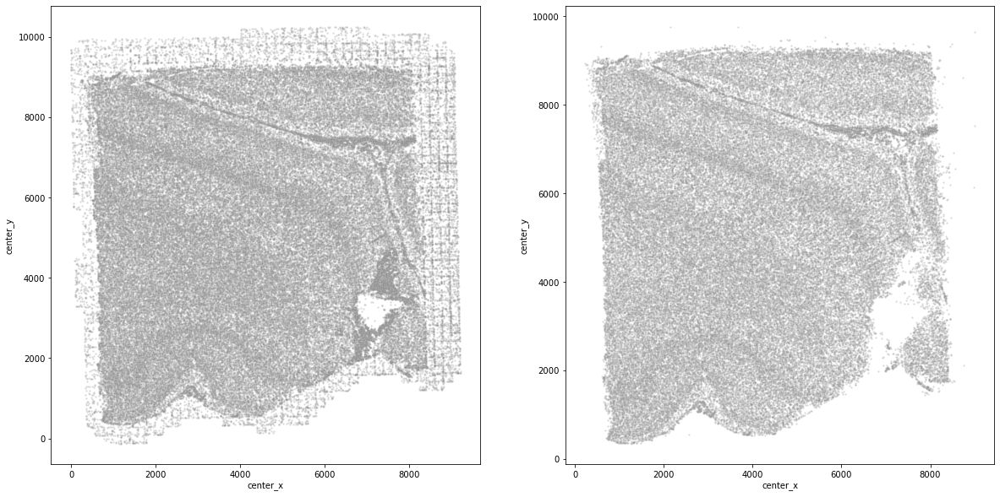

In [284]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
sns.scatterplot(data=cell_meta, x='center_x', y='center_y', color='grey', ax=ax[0], s=5, alpha=0.3)
sns.scatterplot(data=cell_filtered, x='center_x', y='center_y', color='grey', ax=ax[1], s=5, alpha=0.3)